# California Housing Price Prediction

## Context | Problem | Goals

### Context 

California adalah negara bagian yang terletak di pantai barat daya Amerika Serikat. Dikenal dengan julukan "The Golden State" (Negara Emas), California memiliki sejarah, geografi, dan budaya yang sangat kaya. Berikut adalah beberapa poin penting mengenai latar belakang California:<br>

*California Tahun 1990 :* 
* Ekonomi: Pada tahun 1990, California memiliki ekonomi yang terus tumbuh pesat, didukung oleh sektor teknologi,    pertanian, hiburan, dan manufaktur. Silicon Valley, di wilayah San Francisco Bay Area, telah menjadi pusat teknologi global, dan perusahaan teknologi seperti Apple dan Microsoft berperan besar dalam pertumbuhan ekonomi.

* Populasi: Populasi California pada tahun 1990 telah mencapai lebih dari 29 juta penduduk. Seiring pertumbuhan ekonomi, banyak penduduk dari berbagai negara bagian Amerika Serikat dan luar negeri pindah ke California.

* Kebudayaan: California terus mempromosikan keragaman budaya, seni, dan hiburan. Pada tahun 1990, industri hiburan di Hollywood telah lama menjadi pusat produksi film dan televisi dunia.

* Lingkungan: California pada tahun 1990 menghadapi tantangan lingkungan, termasuk masalah kekeringan dan polusi udara. Upaya konservasi dan perlindungan lingkungan semakin menjadi perhatian utama.

California Tahun 2023:

* Ekonomi: Pada tahun 2023, California masih memimpin dalam sektor teknologi, dan Silicon Valley terus menjadi pusat inovasi global. Industri teknologi telah tumbuh lebih lanjut, dengan perusahaan-perusahaan seperti Google, Facebook, dan Tesla memainkan peran besar dalam ekonomi negara bagian.

* Populasi: Populasi California terus bertumbuh dan diperkirakan telah melebihi 40 juta penduduk pada tahun 2023. Pertumbuhan ini terutama disebabkan oleh imigrasi dan kelahiran lebih dari tingkat kematian.

* Kebudayaan: California tetap menjadi pusat budaya dan hiburan, dengan industri hiburan di Hollywood yang terus berkembang. Negara bagian ini juga memiliki berbagai festival budaya dan acara seni yang terkenal.

* Lingkungan: California masih menghadapi masalah lingkungan, terutama dalam hal kekeringan dan kebakaran hutan yang semakin sering dan hebat. Upaya konservasi, energi terbarukan, dan perlindungan lingkungan terus menjadi fokus penting bagi pemerintah dan masyarakat.

California telah mengalami perkembangan besar dari tahun 1990 hingga 2023, tetapi beberapa tantangan seperti masalah lingkungan tetap relevan, sementara industri teknologi dan budaya yang beragam tetap menjadi aspek penting dalam identitas negara bagian ini.



### Problem

#### Problem Statement

Data analyst memiliki data sensus penduduk serta perumahan tahun 1990 mengenai harga perumahan di California yang akan dijadikan acuan sebagai penelitian tentang bagaimana penentuan harga terbaik bagi suatu rumah / tempat tinggal dari aspek-aspek serta fitur dan spesifikasi yang ada pada data. 

### Goals

Dengan fitur-fitur serta spesifikasi yang ada diharapkan <b>dapat dihasilkan model yang seakurat mungkin bisa memprediksi harga sebuah properti/ tempat tinggal tersebut</b>.<br>
Hasil dari model tersebut dapat dijadikan acuan/standar untuk pengambilan keputusan terkait <b>Pembeli</b> untuk pertimbangan mengambil rumah serta <b>Penjual</b> untuk memasarkan rumah.

## Starting Line

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg

import warnings
warnings.filterwarnings('ignore')

In [45]:
df = pd.read_csv('data_california_house.csv')
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0


## Data Preparation

### Data understanding
<a href="https://www.kaggle.com/datasets/camnugent/california-housing-prices/data">California housing Legend berdasarkan kaggle</a>


#### Data understanding (break down)

In [46]:
# Detail tiap fitur
listItem = []

for col in df.columns:
    listItem.append([
                    col, 
                    df[col].dtype, 
                    df[col].isna().sum(), 
                    round((df[col].isna().sum()/len(df[col]))*100, 2),
                    df[col].nunique(), 
                    list(df[col].drop_duplicates().sample(3).values)]);

pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)


,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,longitude,float64,0,0.00,806,"[-119.58, -119.04, -122.38]"
1,latitude,float64,0,0.00,836,"[34.35, 33.92, 34.63]"
2,housing_median_age,float64,0,0.00,52,"[49.0, 32.0, 19.0]"
3,total_rooms,float64,0,0.00,5227,"[5036.0, 2611.0, 2458.0]"
4,total_bedrooms,float64,137,0.95,1748,"[1866.0, 609.0, 1492.0]"
5,population,float64,0,0.00,3498,"[918.0, 1071.0, 1850.0]"
6,households,float64,0,0.00,1649,"[809.0, 1537.0, 4855.0]"
7,median_income,float64,0,0.00,9797,"[2.978, 3.6811, 10.1275]"
8,ocean_proximity,object,0,0.00,5,"[ISLAND, <1H OCEAN, NEAR BAY]"
9,median_house_value,float64,0,0.00,3548,"[480100.0, 323300.0, 210400.0]"


In [47]:
display(df.describe(include='object'),df.describe())

,ocean_proximity
count,14448
unique,5
top,<1H OCEAN
freq,6369


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,14448.000000,14448.000000,14448.000000,14448.000000,14311.000000,14448.000000,14448.000000,14448.000000,14448.000000
mean,-119.566647,35.630093,28.618702,2640.132683,538.260709,1425.157323,499.508929,3.866667,206824.624516
std,2.006587,2.140121,12.596694,2191.612441,423.577544,1149.580157,383.098390,1.891158,115365.476182
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1451.000000,295.000000,784.000000,279.000000,2.570600,119600.000000
50%,-118.490000,34.260000,29.000000,2125.000000,435.000000,1165.000000,410.000000,3.539100,180000.000000
75%,-118.000000,37.710000,37.000000,3148.000000,647.000000,1724.000000,604.000000,4.736100,263900.000000
max,-114.310000,41.950000,52.000000,32627.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [48]:
df['ocean_proximity'].value_counts()

<1H OCEAN     6369
INLAND        4576
NEAR OCEAN    1879
NEAR BAY      1622
ISLAND           2
Name: ocean_proximity, dtype: int64

In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14448 entries, 0 to 14447
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           14448 non-null  float64
 1   latitude            14448 non-null  float64
 2   housing_median_age  14448 non-null  float64
 3   total_rooms         14448 non-null  float64
 4   total_bedrooms      14311 non-null  float64
 5   population          14448 non-null  float64
 6   households          14448 non-null  float64
 7   median_income       14448 non-null  float64
 8   ocean_proximity     14448 non-null  object 
 9   median_house_value  14448 non-null  float64
dtypes: float64(9), object(1)
memory usage: 1.1+ MB


#### Data understanding(Kesimpulan)

Berdasarkan data diatas dapat dijabarkan secara kasat mata bahwa :
1. Dataset memiliki 10 kolom dan 14448 baris
2. Data hanya memiliki 1 kolom kategorikal yaitu ocean_proximity(secara logika ocean proximity adalah jarak antara pesisir pantai denga properti tiap titik garis lintang dan bujur yang diberikan)
3. Terdapat missing value yaitu pada kolom *total_bedrooms* sebanyak 137 baris
4. Kesimpulan sementara tanpa data yang dapat diambil secara asumsi adalah <b>"Harga properti/rumah cenderung akan semakin tinggi apabila ocean proximity semakin dekat kearah pesisir pantai"</b>

### Exploritary Data Analysis - EDA

Untuk mempertegas gagasan/kesimpulan awal yang ada, mari kita re-presentasikan kembali data dalam bentuk grafik menggunakan beberapa plot yang ada :

1. Histogram plot - untuk mengetahui persebaran data secara graphical
2. Scatter plot - kita bisa menggunakan scatter plot untuk melihat persebaran data menggunakan titik garis lintang dan bujur sebagai acuan
3. Heatmap - untuk mengetahui persentasi korelasi antar data 

#### EDA - Scatter Plot

`Penambahan embed california map untuk memberi dukungan terhadap analisis awal`

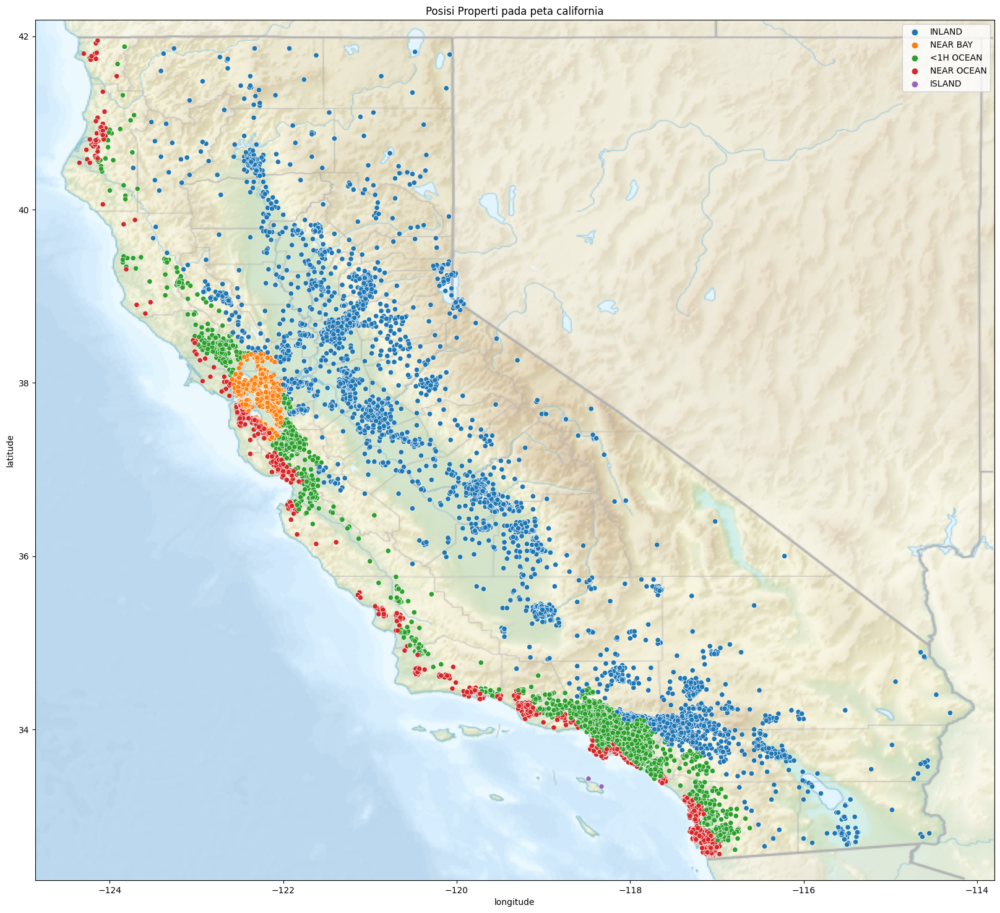

In [50]:
# Scatter plot 1
plt.figure(figsize=(20,20))
sns.scatterplot(data=df, x="longitude", y="latitude",hue=df['ocean_proximity']).set_title('Posisi Properti pada peta california')
california = mpimg.imread('california.png')
plt.imshow(california,extent=[-124.86, -113.8, 32.26, 42.19],alpha=0.5,cmap=plt.get_cmap('jet'))
plt.xlabel=('Longitude')
plt.ylabel=('Latitude')
plt.legend()
plt.show()

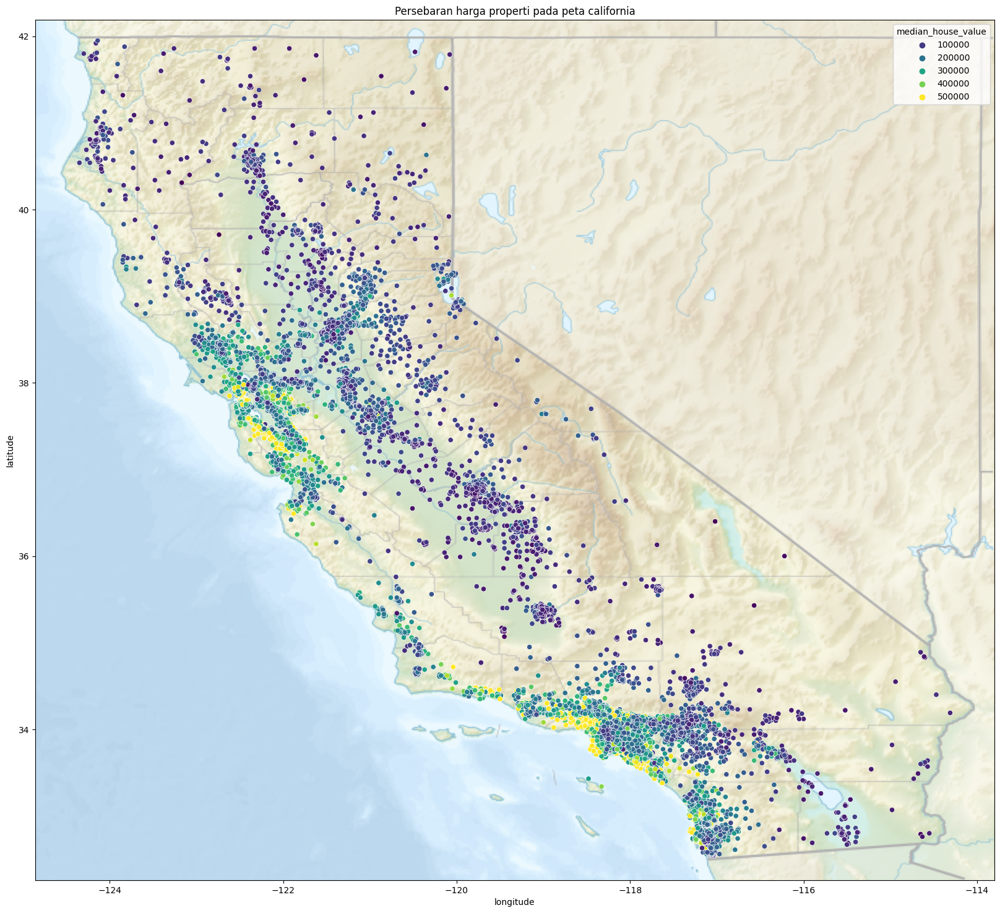

In [51]:
#Scatter plot 2
plt.figure(figsize=(20,20))
sns.scatterplot(data=df, x="longitude", y="latitude",hue=df['median_house_value'],palette='viridis').set_title('Persebaran harga properti pada peta california')
california = mpimg.imread('california.png')
plt.imshow(california,extent=[-124.86, -113.8, 32.26, 42.19],alpha=0.5,cmap=plt.get_cmap('jet'))
plt.xlabel=('Longitude')
plt.ylabel=('Latitude')
plt.show()

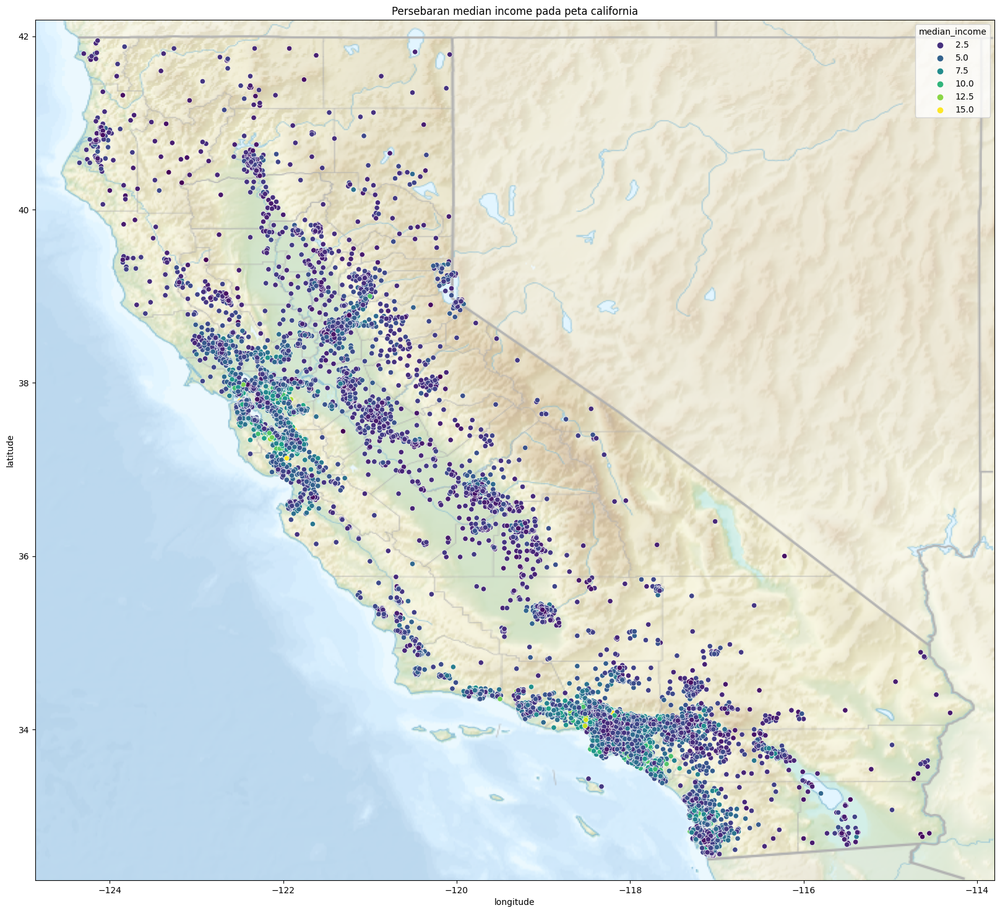

In [52]:
# Scatter plot 3
plt.figure(figsize=(20,20))
sns.scatterplot(data=df, x="longitude", y="latitude",hue=df['median_income'],palette='viridis').set_title('Persebaran median income pada peta california')
california = mpimg.imread('california.png')
plt.imshow(california,extent=[-124.86, -113.8, 32.26, 42.19],alpha=0.5,cmap=plt.get_cmap('jet'))
plt.xlabel=('Longitude')
plt.ylabel=('Latitude')
plt.show()

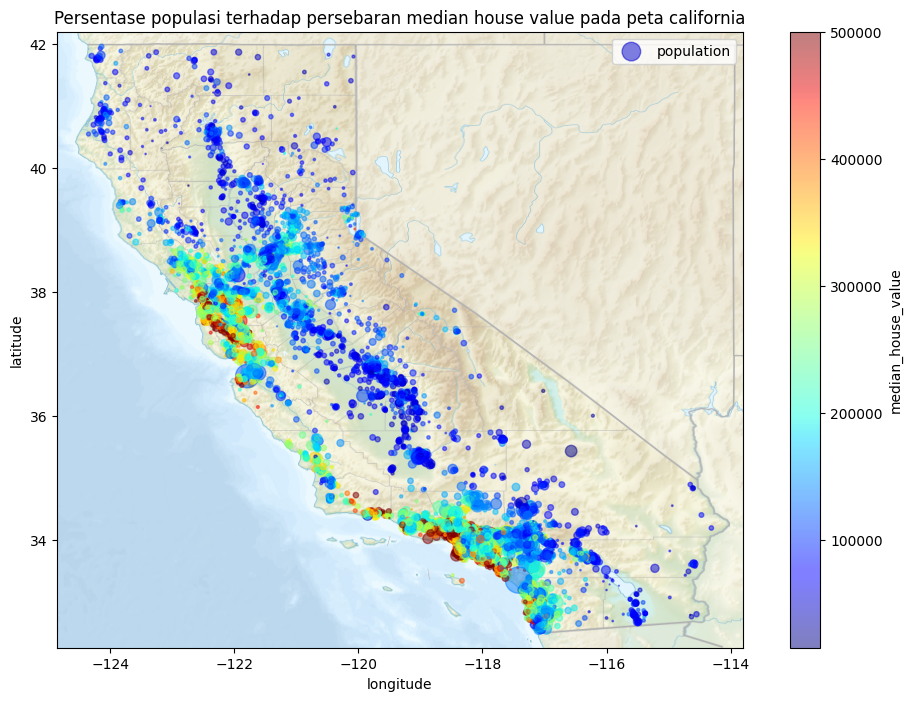

In [53]:
# Scatter plot 4
ax = df.plot(kind='scatter',x='longitude',y='latitude',alpha = 0.5,
             s=df['population']/100,label='population',figsize=(12,8),
             c='median_house_value',cmap=plt.get_cmap('jet'),sharex=False).set_title('Persentase populasi terhadap persebaran median house value pada peta california')

california_img = mpimg.imread('california.png')
plt.imshow(california_img,extent=[-124.86, -113.8, 32.26, 42.19],alpha=0.5,cmap=plt.get_cmap('jet'))
plt.xlabel=('Longitude')
plt.ylabel=('Latitude')
plt.legend()
plt.show()

#### EDA - Heatmap correlation

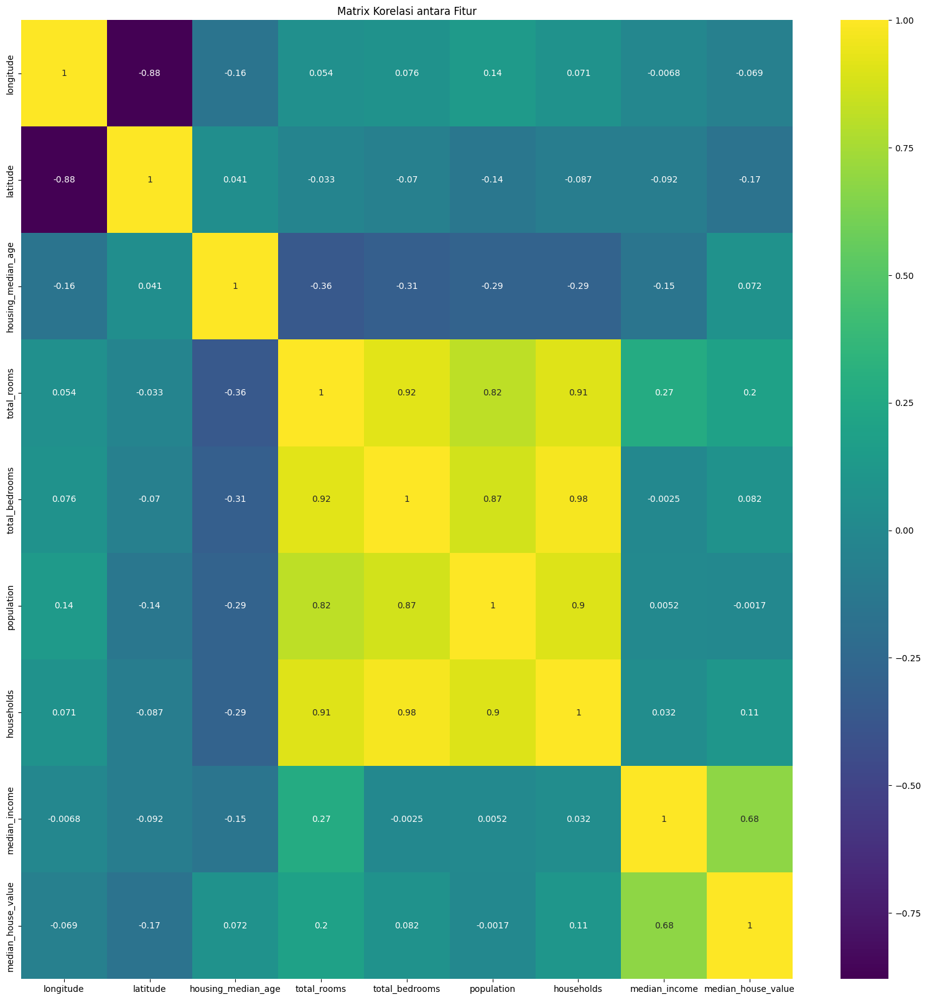

median_house_value    1.000000
median_income         0.680296
total_rooms           0.199245
households            0.108217
total_bedrooms        0.081704
housing_median_age    0.072069
population           -0.001653
longitude            -0.069389
latitude             -0.167250
Name: median_house_value, dtype: float64

In [54]:
plt.figure(figsize=(20,20))
corr = df.corr(method='spearman')
sns.heatmap(corr,annot=True,cmap='viridis').set_title('Matrix Korelasi antara Fitur')
plt.show()
# urutan korelasi dari terbesar sampai paling kecil terhadap median_house_value
display(corr['median_house_value'].sort_values(ascending=False))

#### EDA - Histogram Plot

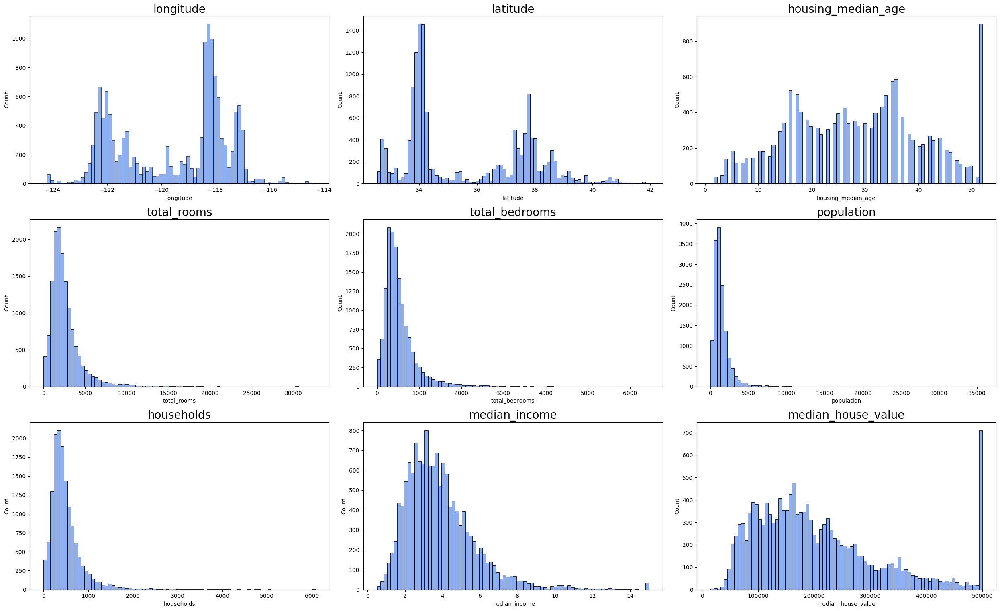

In [55]:
plt.figure(figsize=(25, 25))
plotnumber = 1
num_features = df.select_dtypes(include='number').columns

for feature in num_features:
    ax = plt.subplot(5, 3, plotnumber)
    sns.histplot(data=df,x=feature,color='cornflowerblue',bins=80).set_title(feature, fontsize=20)
    plotnumber += 1
    plt.tight_layout()

#### EDA - Kesimpulan
1. Pada "Scatter plot 1" didukung dengan peta california, dapat dilihat bahwa posisi koordinat near ocean, benar ada di pesisir pantai
2. Pada "Scatter plot 2" dapat dilihat bulk properti dengan harga termahal ada di posisi tengah dan bawah peta california namun 2 bulk tersebut masih sejalan dengan kesimpulan awal yaitu berada didekat pesisir pantai
3. Pada "Korelasi heatmap" dapat dilihat bahwa korelasi dengan median_house_value yang tertinggi adalah pada median_income, pada "Scatter plot 3" walaupun tidak tercermin secera jelas namun memang terlihat bahwa pemilik median income tertinggi rata2 tersebar pada daerah yang ditunjukan oleh poin 2, jadi masih bisa dikatakan korelasi tersebut masih bisa dibilang valid
4. Pada histogram plot kita dapat mengecualikan grafik longitude dan latitude dikarenaka seharus-nya kolom tersebut berupa kategorikal namun tipe data harus dipertahankan agar dapat menjadi titik koordinat, persebaran data yang terlihat aneh / tidak terdistribusi normal dapat dilihat pada grafik median_house_value(ada lebih dari 600 properti dengan harga $500.001(max value kolom median_house_value) serta pada housing_median_age dimana ada lebih dari 800 properti yang berusia 52 tahun(max value kolom housing_median_age))

### Data PreProcessing

Setelah data kita breakdown pada EDA, mari kita pre-process data-data nya agar sesuai dengan kebutuhan analisis serta pembuatan model.

1. Duplicates
2. Missing Value
3. Abnormal Data
4. Outliers

#### DP - Duplicates Data

In [56]:
df.duplicated().sum()

0

#### DP - Missing value

Pada data understanding awal sudah diketahui bahwa ada 137 baris atau 0.95 persen dari total data yang ada.
dikarenakan missing value yang terdapat pada dataset tidak signifikan, cara yang paling cepat adalah dengan <b>melakukan drop pada data tersebut</b>, namun sebisa mungkin mari kita mencoba mengisi missing value tersebut(menggunakan median) agar model yang dibuat dapat mempertahankan data se-original mungkin

In [57]:
# buat df copy terhadap data yang value total bedroom-nya null saja
df_copy=df[df.isnull().any(axis=1)]
df_copy

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
88,-121.47,38.61,31.0,1072.0,NaN,781.0,281.0,1.6563,INLAND,65800.0
119,-117.28,34.26,18.0,3895.0,NaN,1086.0,375.0,3.3672,INLAND,133600.0
251,-117.61,34.08,12.0,4427.0,NaN,2400.0,843.0,4.7147,INLAND,158700.0
340,-122.70,38.35,14.0,2313.0,NaN,954.0,397.0,3.7813,<1H OCEAN,146500.0
410,-122.42,40.44,16.0,994.0,NaN,495.0,181.0,2.1875,INLAND,76400.0
...,...,...,...,...,...,...,...,...,...,...
13856,-117.96,34.03,35.0,2093.0,NaN,1755.0,403.0,3.4115,<1H OCEAN,150400.0
13932,-117.87,33.83,27.0,2287.0,NaN,1140.0,351.0,5.6163,<1H OCEAN,231000.0
13989,-118.40,34.17,24.0,6347.0,NaN,2945.0,1492.0,3.3545,<1H OCEAN,221500.0
14308,-118.55,34.19,18.0,5862.0,NaN,3161.0,1280.0,3.1106,<1H OCEAN,170600.0


In [58]:
# mari kita isi missing value dengan median dari total_bedroom dengan asumsi median total_bedroom > dari total_rooms pada semua baris
median = df['total_bedrooms'].median()
df_copy['total_bedrooms'].fillna(median,inplace=True)
df_copy

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
88,-121.47,38.61,31.0,1072.0,435.0,781.0,281.0,1.6563,INLAND,65800.0
119,-117.28,34.26,18.0,3895.0,435.0,1086.0,375.0,3.3672,INLAND,133600.0
251,-117.61,34.08,12.0,4427.0,435.0,2400.0,843.0,4.7147,INLAND,158700.0
340,-122.70,38.35,14.0,2313.0,435.0,954.0,397.0,3.7813,<1H OCEAN,146500.0
410,-122.42,40.44,16.0,994.0,435.0,495.0,181.0,2.1875,INLAND,76400.0
...,...,...,...,...,...,...,...,...,...,...
13856,-117.96,34.03,35.0,2093.0,435.0,1755.0,403.0,3.4115,<1H OCEAN,150400.0
13932,-117.87,33.83,27.0,2287.0,435.0,1140.0,351.0,5.6163,<1H OCEAN,231000.0
13989,-118.40,34.17,24.0,6347.0,435.0,2945.0,1492.0,3.3545,<1H OCEAN,221500.0
14308,-118.55,34.19,18.0,5862.0,435.0,3161.0,1280.0,3.1106,<1H OCEAN,170600.0


In [59]:
# pengecekan apabila ada total_bedrooms yang lebih banyak dari total_rooms yang membuat metode ini tidak valid
df_copy['method_checker']=df_copy['total_rooms'].sub(df_copy['total_bedrooms'])
display(df_copy,df_copy[df_copy['method_checker']<0].value_counts())

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,method_checker
88,-121.47,38.61,31.0,1072.0,435.0,781.0,281.0,1.6563,INLAND,65800.0,637.0
119,-117.28,34.26,18.0,3895.0,435.0,1086.0,375.0,3.3672,INLAND,133600.0,3460.0
251,-117.61,34.08,12.0,4427.0,435.0,2400.0,843.0,4.7147,INLAND,158700.0,3992.0
340,-122.70,38.35,14.0,2313.0,435.0,954.0,397.0,3.7813,<1H OCEAN,146500.0,1878.0
410,-122.42,40.44,16.0,994.0,435.0,495.0,181.0,2.1875,INLAND,76400.0,559.0
...,...,...,...,...,...,...,...,...,...,...,...
13856,-117.96,34.03,35.0,2093.0,435.0,1755.0,403.0,3.4115,<1H OCEAN,150400.0,1658.0
13932,-117.87,33.83,27.0,2287.0,435.0,1140.0,351.0,5.6163,<1H OCEAN,231000.0,1852.0
13989,-118.40,34.17,24.0,6347.0,435.0,2945.0,1492.0,3.3545,<1H OCEAN,221500.0,5912.0
14308,-118.55,34.19,18.0,5862.0,435.0,3161.0,1280.0,3.1106,<1H OCEAN,170600.0,5427.0


Series([], dtype: int64)

In [60]:
# dapat dilihat bahwa pengisian median value kepada missing value dapat digunakan karena tidak menyebabkan ada-nya abnormalitas pada hubungan antar data maka dapat diaplikasikan pada data utama
df['total_bedrooms'].fillna(median,inplace=True)
df.isna().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
ocean_proximity       0
median_house_value    0
dtype: int64

#### DP - Data abnormal

Data abnormal adalah data yang bersifat aneh atau tidak normal pada umum-nya.

Abnormal data adalah data-data yang bersifat tidak normal pada umum-nya dan tidak dapat di detect dari EDA - Histogram(sebagai contoh dapat dilihat pada histogram bahwa tidak ada negative value pada kolom numerikal terkecuali kolom longitude). Dalam contoh kasus ini setelah di telaah lebih jauh 1-1 nya case yang dapat menimbulkan data abnormality terjadi adalah jika total bedrooms lebih banyak dari total rooms, secara logika total rooms pada properti meliput semua ruangan yang ada termasuk bathroom, storage, attic, dan lain-lain, sedangkan bedrooms adalah bagian dari total rooms.

In [61]:
# Pengecekan apakah ada data dari total_rooms yang lebih besar dari total_bedrooms
df[df['total_rooms']<df['total_bedrooms']].value_counts()

Series([], dtype: int64)

#### DP - Outliers

Pada *EDA - Kesimpulan* kita sudah mengetahui bahwa <b>median_house_value</b> dan <b>housing_median_age</b> tidak terdistribusi secara normal apabila dilihat dari *EDA - Histogram*. Dikarenakan outliers akan sangat mempengaruhi pemodelan, maka outliers tersebut harus di handle agar model yang dihasilkan tidak bias.

##### Outliers - Analisa

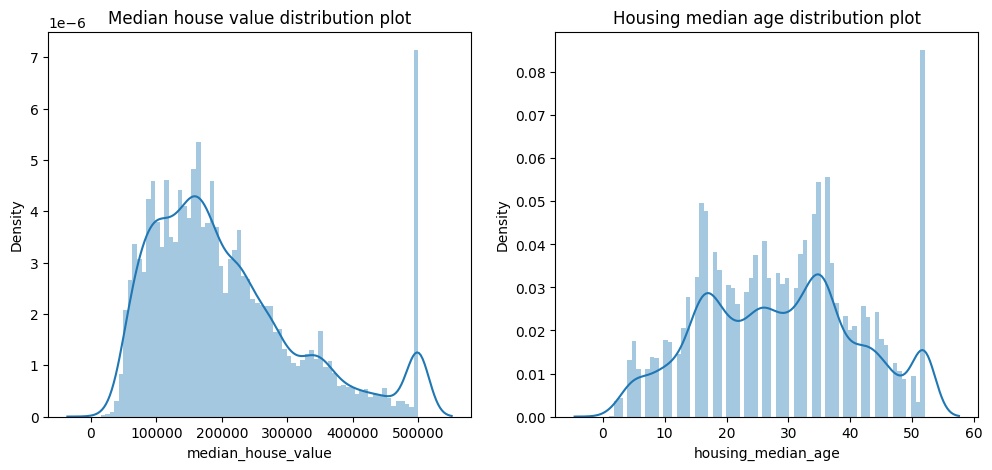

In [62]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.distplot(df['median_house_value'],kde=True,bins=70).set_title('Median house value distribution plot')
plt.subplot(1,2,2)
sns.distplot(df['housing_median_age'],kde=True,bins=70).set_title('Housing median age distribution plot')
plt.show()

In [63]:
# Dapat dilihat density data terbanyak ada pada value terakhir, mari kita lihat persebaran-nya
display(df.groupby(by='median_house_value')['median_house_value'].count().sort_index(ascending=False)
        .head(10),df.groupby(by='housing_median_age')['housing_median_age'].count().sort_index(ascending=False).head(10))


median_house_value
500001.0    678
500000.0     18
499100.0      1
499000.0      1
498700.0      1
498600.0      1
497400.0      1
496400.0      2
496000.0      1
495900.0      1
Name: median_house_value, dtype: int64

housing_median_age
52.0    896
51.0     36
50.0     99
49.0     93
48.0    111
47.0    132
46.0    176
45.0    189
44.0    256
43.0    244
Name: housing_median_age, dtype: int64

##### Outliers - Drop the outliers

In [64]:
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0
...,...,...,...,...,...,...,...,...,...,...
14443,-121.26,38.27,20.0,1314.0,229.0,712.0,219.0,4.4125,INLAND,144600.0
14444,-120.89,37.48,27.0,1118.0,195.0,647.0,209.0,2.9135,INLAND,159400.0
14445,-121.90,36.58,31.0,1431.0,435.0,704.0,393.0,3.1977,NEAR OCEAN,289300.0
14446,-117.93,33.62,34.0,2125.0,498.0,1052.0,468.0,5.6315,<1H OCEAN,484600.0


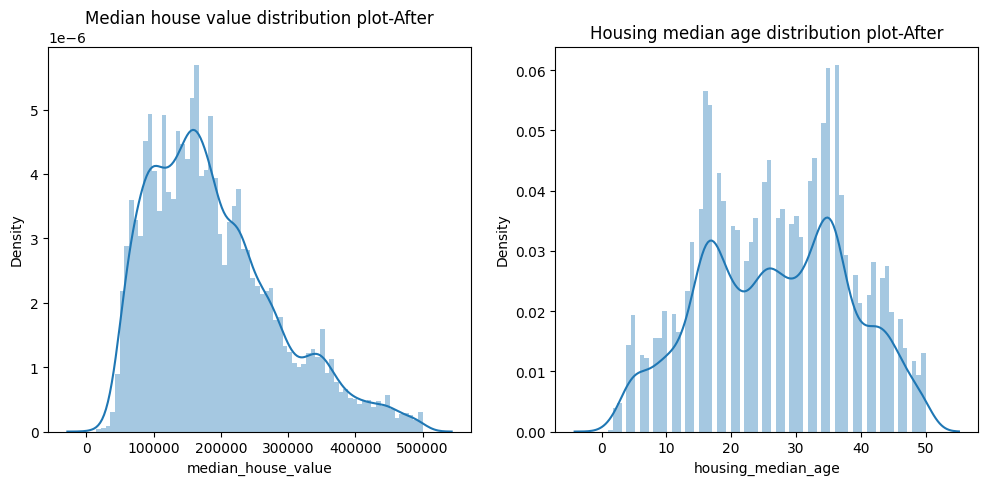

In [65]:
df = df.drop(df[df['median_house_value']==500001.0].index)
df = df.drop(df[df['housing_median_age']==52.0].index)
df['housing_median_age'].where(df['housing_median_age'] < 50,other=50,inplace=True)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.distplot(df['median_house_value'],kde=True,bins=70).set_title('Median house value distribution plot-After')
plt.subplot(1,2,2)
sns.distplot(df['housing_median_age'],kde=True,bins=70).set_title('Housing median age distribution plot-After')
plt.show()

#### DP - Kesimpulan dan Justifikasi

* <b>DP - Duplicate data :</b> Tidak ditemukan duplicate data pada data frame

* <b>DP - Missing value :</b> Pada missing value data analyst memutuskan untuk mempertahankan row missing value dengan mengisi kolom total_bedroom dengan justifikasi bahwa total_bedroom tidak secara signifikan mempengaruhi median_house_value yang didukung oleh korelasi matrix ada poin <b>EDA - Heatmap Correlation</b>(hanya sebesar 8% saja), Setelah data total_bedrooms diisi dengan median dapat dilihat bahwa tidak ada abnormal behaviour yang terbentuk.

* <b>DP - Data Abnormality :</b> Tidak ditemukan adanya data abnormality

* <b>DP - Outliers :</b> pada <i>Median_house_value</i> terdapat 678 data dengan harga properti 500.001, Secara logika data ini tidak wajar dan dapat diasumsikan sebagai admin sensus tidak mendapatkan data harga properti actual pada tahun 1990 dikarenakan 1 dan lain hal maka dari itu semua di pool pada 1 kategori yaitu 500.001. Dikarenakan data yang di provide tidak actual maka outlier ini dapat kita delete.
<br>
Demikian pula pada <i>housing_median_age</i> dapat dilihat bahwa ada 896 properti yang tercatat memiliki umur 52 tahun, memang data tersebut bisa saja benar ada-nya jika dilihat dari sudut pandang california sudah dideklarasikan semenjak tahun 1850 rumah berumur 52 tahun itu masih dalam batas logis, namun ada-nya kecurigaan bahwa sensus tidak dapat mengukur rumah yang berusia lebih dari 51 tahun, sehingga semua rumah yang berumur lebih dari 51 tahun di pool pada 1 kategori yaitu 52. Dikarenakan kecurigaan tersebut outlier ini diputuskan untuk di delete dengan harapan model yang dihasilkan tidak bias. Lalu untuk contoh kasus kali ini data analyst memutuskan untuk merubah data rumah yang berumur 51 tahun menjadi 50 tahun untuk keperluan machine learning

### Feature Engineering

Setelah data selesai di pre-process mari kita lakukan tahap feature engineering untuk keperluan mempertajam analisa pada regresi-nya dengan langkah-langkah sebagai berikut :
* Feature Selection - Adding and Deleting
* Binning Data

#### FE - Feature Selection

Pada proses ini kita dapat melakukan adjustment pada data berupa delete row maupun menambah kolom untuk menambah keakuratan pada model

In [66]:
df['ocean_proximity'].value_counts()

<1H OCEAN     5818
INLAND        4442
NEAR OCEAN    1639
NEAR BAY      1100
ISLAND           1
Name: ocean_proximity, dtype: int64

In [67]:
# dikarenakan hanya ada 1 data, maka dapat diasumsikan bahwa data tidak signifikan terhadap analisa.
df=df.drop(df[df['ocean_proximity']=='ISLAND'].index)

#### FE - Binning Data

<Axes: >

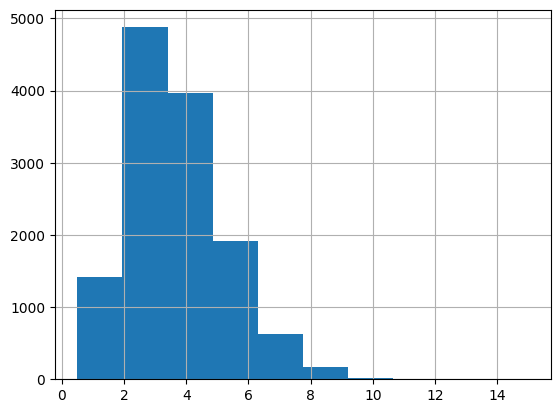

In [68]:
# mari kita Binning median income karena memiliki korelasi paling tinggi dengan median_house_value
df['median_income'].hist()

Penambahan Income_cat dengan rules sebagai berikut :<br>
1.0 = Poor
2.0 = Lower-Middle Class<br>
3.0 = Middle Class<br>
4.0 = Upper-Middle Class<br>
5.0 = Wealthy

In [69]:
df['income_cat'] = np.ceil(df['median_income']/1.5)
df['income_cat'].where(df['income_cat'] < 5,other=5.0,inplace=True)
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,income_cat
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0,2.0
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0,5.0
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0,2.0
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0,2.0
5,-117.79,33.80,11.0,10535.0,1620.0,4409.0,1622.0,6.6700,<1H OCEAN,283200.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...
14443,-121.26,38.27,20.0,1314.0,229.0,712.0,219.0,4.4125,INLAND,144600.0,3.0
14444,-120.89,37.48,27.0,1118.0,195.0,647.0,209.0,2.9135,INLAND,159400.0,2.0
14445,-121.90,36.58,31.0,1431.0,435.0,704.0,393.0,3.1977,NEAR OCEAN,289300.0,3.0
14446,-117.93,33.62,34.0,2125.0,498.0,1052.0,468.0,5.6315,<1H OCEAN,484600.0,4.0


<Axes: >

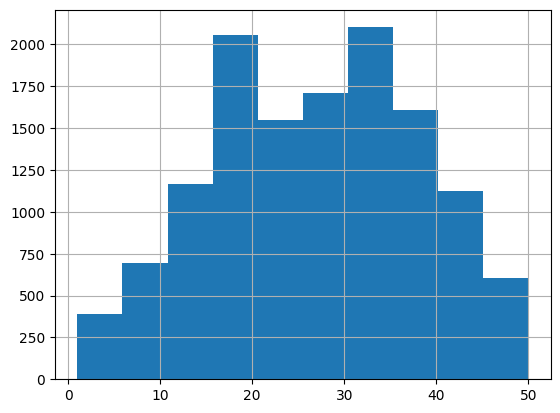

In [70]:
df['housing_median_age'].hist()

Fitur baru dengan nama housingage_cat dengan rules sebagai berikut :
* 0-15 tahun = New
* 16-25 tahun = Old House
* 26-35 tahun = Antique House
* 35-50 tahun = State Heritage

In [71]:
age = [0,15,25,35,51]
Newcat=['New','Old House','Antique House','State Heritage']
df['housingage_cat']=pd.cut(df['housing_median_age'],bins=age,labels=Newcat)
df['housingage_cat'].value_counts()

Antique House     3811
Old House         3604
State Heritage    3340
New               2244
Name: housingage_cat, dtype: int64

#### FE - Argumentasi dan Kesimpulan

dikarenakan hanya ada 1 kategorikal pada data set yang diberikan, untuk lebih memperluas jangkauan machine learing dan hasil analisa semakin diverse maka dilakukan penambahan kolom baru guna memperkuat model regresi yang akan dibuat.


* Pada Binning Median_Income, berdasarkan google ada 5 Income group / category di Amerika sesuai dengan rules diatas, maka dari itu, setelah melihat histogram grafikal-nya agar sekira-nya dapat dibagi menjadi 5 kategori, value dibagi 1.5 dan dibulatkan keatas, dan hasil di atas 5.0 disamakan dengan 5.0

* Setelah melihat raw data kembali walaupun persentase korelasi tidak terlalu besar namun data analyst melihat ada-nya potensi housing_median_age bisa di binning untuk dijadikan fitur tambahan machine learning.

In [72]:
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, GridSearchCV, KFold

import category_encoders as ce
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost.sklearn import XGBRegressor
from sklearn.compose import TransformedTargetRegressor

from sklearn.preprocessing import StandardScaler

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

### Data Modelling

Dibagi menjadi 
* Encoding
* Data Splitting
* Train and Test splitting

In [73]:
dfModel = df.copy()
dfModel.drop(['median_income','housing_median_age'],axis=1,inplace=True)
dfModel.head()

,longitude,latitude,total_rooms,total_bedrooms,population,households,ocean_proximity,median_house_value,income_cat,housingage_cat
1,-122.21,37.77,1017.0,328.0,836.0,277.0,NEAR BAY,100000.0,2.0,State Heritage
2,-118.04,33.87,2358.0,396.0,1387.0,364.0,<1H OCEAN,285800.0,5.0,Old House
3,-118.28,34.06,2518.0,1196.0,3051.0,1000.0,<1H OCEAN,175000.0,2.0,Old House
4,-119.81,36.73,772.0,194.0,606.0,167.0,INLAND,59200.0,2.0,State Heritage
5,-117.79,33.80,10535.0,1620.0,4409.0,1622.0,<1H OCEAN,283200.0,5.0,New


#### Encoding

In [74]:
transformer = ColumnTransformer([
    ('One Hot', OneHotEncoder(drop='first'), ['ocean_proximity', 'income_cat','housingage_cat'])
], remainder='passthrough')

In [75]:
X = dfModel.drop(['median_house_value'],axis=1)
y = dfModel['median_house_value']

In [76]:
X_train, X_test, y_train, y_test= train_test_split(
    X,
    y,  
    test_size=0.3,
    random_state=1
    )

In [77]:
# Define algoritma yang digunakan
lr = LinearRegression()
knn = KNeighborsRegressor()
dt = DecisionTreeRegressor(random_state=1)
rf = RandomForestRegressor(random_state=1)
xgb = XGBRegressor(random_state=1)

# Pemodelan dilakukan dalam skala logaritmik, namun kemudian di-inverse kembali untuk interpretasi
log_lr = TransformedTargetRegressor(lr, func=np.log, inverse_func=np.exp)
log_knn = TransformedTargetRegressor(knn, func=np.log, inverse_func=np.exp)
log_dt = TransformedTargetRegressor(dt, func=np.log, inverse_func=np.exp)
log_rf = TransformedTargetRegressor(rf, func=np.log, inverse_func=np.exp)
log_xgb = TransformedTargetRegressor(xgb, func=np.log, inverse_func=np.exp)

# Scaling data
scaler = StandardScaler()

# Kandidat algoritma
models = [log_lr, log_knn, log_dt, log_rf, log_xgb]

score_rmse = []
nilai_mean_rmse = []
nilai_std_rmse = []

score_mae = []
nilai_mean_mae = []
nilai_std_mae = []

score_mape = []
nilai_mean_mape = []
nilai_std_mape = []

# Mencari algoritma terbaik berdasarkan tiap metrics
for i in models:
    
    crossval = KFold(n_splits=5, shuffle=True, random_state=1)

    estimator = Pipeline([
        ('preprocessing', transformer),
        ('scaler', scaler),
        ('model', i)
    ])

    # RMSE
    model_cv_rmse = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_root_mean_squared_error', 
        error_score='raise'
        )

    print(model_cv_rmse, i)

    score_rmse.append(model_cv_rmse)
    nilai_mean_rmse.append(model_cv_rmse.mean())
    nilai_std_rmse.append(model_cv_rmse.std())

    # MAE
    model_cv_mae = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_mean_absolute_error', 
        error_score='raise'
        )

    print(model_cv_mae, i)

    score_mae.append(model_cv_mae)
    nilai_mean_mae.append(model_cv_mae.mean())
    nilai_std_mae.append(model_cv_mae.std())

    # MAPE
    model_cv_mape = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_mean_absolute_percentage_error', 
        error_score='raise'
        )

    print(model_cv_mape, i)

    score_mape.append(model_cv_mape)
    nilai_mean_mape.append(model_cv_mape.mean())
    nilai_std_mape.append(model_cv_mape.std())

[-62304.01551617 -60299.47991956 -61852.09716767 -61211.59272543
 -65760.28185557] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=LinearRegression())
[-44192.78548467 -42734.6477478  -43791.07269679 -43928.9700199
 -46418.87006456] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=LinearRegression())
[-0.24694497 -0.2466641  -0.2537037  -0.25709528 -0.26614049] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=LinearRegression())
[-59468.92496155 -55984.71803476 -57264.76631983 -57475.63896903
 -62200.94324221] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=KNeighborsRegressor())


[-41231.27216399 -39395.80287954 -39193.36642894 -39736.35153339
 -43094.64984884] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=KNeighborsRegressor())
[-0.22769611 -0.22492411 -0.22089433 -0.2247377  -0.24401304] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=KNeighborsRegressor())
[-66545.61351203 -62645.0559778  -64104.703887   -64612.70972682
 -68636.13763977] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=DecisionTreeRegressor(random_state=1))
[-44057.52802198 -41143.57142857 -42616.75824176 -42417.85769231
 -44939.36338648] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=DecisionTreeRegressor(random_state=1))
[-0.24307402 -0.23599649 -0.24296172 -0.24126452 -0.2606352 ] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_

In [78]:
pd.DataFrame({
    'Model': ['Linear Regression', 'KNN Regressor', 'DecisionTree Regressor', 'RandomForest Regressor', 'XGBoost Regressor'],
    'Mean_RMSE': nilai_mean_rmse,
    'Std_RMSE': nilai_std_rmse,
    'Mean_MAE': nilai_mean_mae,
    'Std_MAE': nilai_std_mae,
    'Mean_MAPE': nilai_mean_mape,
    'Std_MAPE': nilai_std_mape
})

,Model,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
0,Linear Regression,-62285.493437,1863.321893,-44213.269203,1209.172615,-0.254110,0.007219
1,KNN Regressor,-58478.998305,2169.578403,-40530.288571,1467.792995,-0.228453,0.008076
2,DecisionTree Regressor,-65308.844149,2079.942536,-43035.015754,1327.061136,-0.244786,0.008332
3,RandomForest Regressor,-48417.943944,1817.186837,-31841.759454,873.873574,-0.177591,0.005341
4,XGBoost Regressor,-46680.068606,1685.042595,-30517.541781,734.492927,-0.170928,0.003535


In [79]:
models = {
    'XGB': XGBRegressor(random_state=1),
    'RandomForest': RandomForestRegressor(random_state=1)
}

score_rmse = []
score_mae = []
score_mape = []

# Prediksi pada test set
for i in models:

    model = Pipeline([
        ('preprocessing', transformer),
        ('scaler', scaler),
        ('model', models[i])
        ])

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score_rmse.append(np.sqrt(mean_squared_error(y_test, y_pred)))
    score_mae.append(mean_absolute_error(y_test, y_pred))
    score_mape.append(mean_absolute_percentage_error(y_test, y_pred))

score_before_tuning = pd.DataFrame({'RMSE': score_rmse, 'MAE': score_mae, 'MAPE': score_mape}, index=models.keys())
score_before_tuning

,RMSE,MAE,MAPE
XGB,44897.129630,30762.348549,0.179370
RandomForest,45875.235351,30998.640479,0.176447


In [80]:
# Kedalaman pohon
max_depth = list(np.arange(1, 11))

# Learning rate
learning_rate = list(np.arange(1, 100)/100)

# Jumlah pohon
n_estimators = list(np.arange(100, 201))

# Jumlah baris tiap pohon (% dari total baris train set)
subsample = list(np.arange(2, 10)/10)

# Gamma (min_impurity_decrease)
gamma = list(np.arange(1, 11)) # Semakin besar nilainya, semakin konservatif/simpel modelnya

# Jumlah feature yang digunakan untuk tiap pohon (% dari total kolom train set)
colsample_bytree = list(np.arange(1, 10)/10)

# Alpha (regularization)
reg_alpha = list(np.logspace(-3, 1, 10)) # Semakin besar nilainya, semakin konservatif/simpel modelnya


# Hyperparam space XGboost
hyperparam_space_xgb = {
    'model__max_depth': max_depth, 
    'model__learning_rate': learning_rate,
    'model__n_estimators': n_estimators,
    'model__subsample': subsample,
    'model__gamma': gamma,
    'model__colsample_bytree': colsample_bytree,
    'model__reg_alpha': reg_alpha
}

In [81]:
# Benchmark model dengan hyperparameter tuning
xgb = XGBRegressor(random_state=1, verbosity=0)

# Membuat algorithm chains
estimator_xgb = Pipeline([
        ('preprocessing', transformer),
        ('scaler', scaler),
        ('model', xgb)
        ])

crossval = KFold(n_splits=5, shuffle=True, random_state=1)

# Hyperparameter tuning
random_xgb = RandomizedSearchCV(
    estimator_xgb, 
    param_distributions = hyperparam_space_xgb,
    n_iter = 50,
    cv = crossval, 
    scoring = ['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs = -1,
    refit = 'neg_root_mean_squared_error', # Hanya bisa memilih salah stau metric untuk optimisasi
    random_state = 1  
)

In [82]:
# Fitting data training untuk mencari parameter terbaik
random_xgb.fit(X_train, y_train)

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('One '
                                                                               'Hot',
                                                                               OneHotEncoder(drop='first'),
                                                                               ['ocean_proximity',
                                                                                'income_cat',
                                                                                'housingage_cat'])])),
                                             ('scaler', StandardScaler()),
                                             ('model',
                                              XGBRegressor(base_score=None,
                                                           booster=None,
                                                           callbacks=...
                                                             0.007742636826811269,
                                                             0.021544346900318832,
                                                             0.05994842503189409,
                                                             0.1668100537200059,
                                                             0.46415888336127775,
                                                             1.2915496650148828,
                                                             3.593813663804626,
                                                             10.0],
                                        'model__subsample': [0.2, 0.3, 0.4, 0.5,
                                                             0.6, 0.7, 0.8,
                                                             0.9]},
                   random_state=1, refit='neg_root_mean_squared_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [83]:
# Melihat hasil tuning dalam bentuk dataframe. Diurutkan berdasarkan RMSE, MAE & MAPE
pd.DataFrame(random_xgb.cv_results_).sort_values(by=['rank_test_neg_root_mean_squared_error', 'rank_test_neg_mean_absolute_error', 'rank_test_neg_mean_absolute_percentage_error']).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__subsample,param_model__reg_alpha,param_model__n_estimators,param_model__max_depth,param_model__learning_rate,param_model__gamma,...,std_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error,split0_test_neg_mean_absolute_percentage_error,split1_test_neg_mean_absolute_percentage_error,split2_test_neg_mean_absolute_percentage_error,split3_test_neg_mean_absolute_percentage_error,split4_test_neg_mean_absolute_percentage_error,mean_test_neg_mean_absolute_percentage_error,std_test_neg_mean_absolute_percentage_error,rank_test_neg_mean_absolute_percentage_error
7,2.144145,0.081196,0.037760,0.007673,0.9,0.059948,119,8,0.05,5,...,630.884187,1,-0.181116,-0.187420,-0.184071,-0.186922,-0.197321,-0.187370,0.005463,1
20,0.723115,0.094983,0.028002,0.007011,0.9,0.007743,143,4,0.38,6,...,778.173785,2,-0.189253,-0.195106,-0.194508,-0.191203,-0.198734,-0.193761,0.003285,2
3,1.960755,0.169188,0.098217,0.026186,0.5,0.021544,166,8,0.1,9,...,599.833151,3,-0.195983,-0.197875,-0.198115,-0.202898,-0.208562,-0.200687,0.004551,4
8,1.264521,0.037590,0.045238,0.012151,0.7,0.021544,182,6,0.31,2,...,771.219031,4,-0.194594,-0.198427,-0.193694,-0.191902,-0.202862,-0.196296,0.003915,3
17,1.410090,0.212181,0.036591,0.006087,0.6,0.001,190,5,0.04,9,...,617.533235,6,-0.196871,-0.204516,-0.199928,-0.204508,-0.214096,-0.203984,0.005828,5


In [84]:
# Cek skor dan params terbaik
print('XGBoost')
print('Best_score:', random_xgb.best_score_)
print('Best_params:', random_xgb.best_params_)

XGBoost
Best_score: -46461.70704355135
Best_params: {'model__subsample': 0.9, 'model__reg_alpha': 0.05994842503189409, 'model__n_estimators': 119, 'model__max_depth': 8, 'model__learning_rate': 0.05, 'model__gamma': 5, 'model__colsample_bytree': 0.8}


In [106]:
#Hyperparam Space Random Forest

# Jumlah pohon pada random forest
n_estimators = list(np.arange(100,201))

# Jumlah fitur yang perlu dipertimbangkan di setiap split
max_features = list(np.arange(2,11))

# kedalaman pohon
max_depth = list(np.arange(1,11))

# Jumlah minimum sampel yang diperlukan untuk split sebuah node
min_sample_split = list(np.arange(2,21))

# Jumlah minumum sampel yang diperlukan pada setiap leaf
min_samples_leaf = list(np.arange(1,21))

hyperparam_space_rf= {
    'model__n_estimators': n_estimators,
    'model__max_features' : max_features,
    'model__max_depth': max_depth,
    'model__min_samples_split' : min_sample_split,
    'model__min_samples_leaf' : min_samples_leaf,

}

In [107]:
# Random Forest dengan hyperparameter tuning
rf = RandomForestRegressor(random_state=0)

# Membuat algorithm chains
estimator_rf = Pipeline([
        ('preprocessing', transformer),
        ('scaler', scaler),
        ('model', rf)
        ])

crossval = KFold(n_splits=5, shuffle=True, random_state=0)

# Hyperparameter tuning
random_rf = RandomizedSearchCV(
    estimator_rf, 
    param_distributions = hyperparam_space_rf,
    n_iter = 100,
    cv = crossval, 
    scoring = ['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs = -1,
    refit = 'neg_root_mean_squared_error', # Hanya bisa memilih salah stau metric untuk optimisasi
    random_state = 1  
)

In [108]:
random_rf.fit(X_train,y_train)

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('One '
                                                                               'Hot',
                                                                               OneHotEncoder(drop='first'),
                                                                               ['ocean_proximity',
                                                                                'income_cat',
                                                                                'housingage_cat'])])),
                                             ('scaler', StandardScaler()),
                                             ('model',
                                              RandomForestRegressor(random_state=0))]),
                   n_iter=100,...
                                        'model__min_samples_split': [2, 3, 4, 5,
                                                                     6, 7, 8, 9,
                                                                     10, 11, 12,
                                                                     13, 14, 15,
                                                                     16, 17, 18,
                                                                     19, 20],
                                        'model__n_estimators': [100, 101, 102,
                                                                103, 104, 105,
                                                                106, 107, 108,
                                                                109, 110, 111,
                                                                112, 113, 114,
                                                                115, 116, 117,
                                                                118, 119, 120,
                                                                121, 122, 123,
                                                                124, 125, 126,
                                                                127, 128, 129, ...]},
                   random_state=1, refit='neg_root_mean_squared_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [111]:
# Cek skor dan params terbaik
print('RandomForest')
print('Best_score:', random_rf.best_score_)
print('Best_params:', random_rf.best_params_)

RandomForest
Best_score: -52766.551269884396
Best_params: {'model__n_estimators': 150, 'model__min_samples_split': 4, 'model__min_samples_leaf': 13, 'model__max_features': 10, 'model__max_depth': 10}


In [115]:
# Model XGBoost
model = {'XGB': XGBRegressor(random_state=1)}

# Define model terhadap estimator terbaik
xgb_tuning = random_xgb.best_estimator_

# Fitting model
xgb_tuning.fit(X_train, y_train)

# Predict test set
y_pred_xgb_tuning = xgb_tuning.predict(X_test)

# Simpan nilai metrics RMSE, MAE & MAPE setelah tuning
rmse_xgb_tuning = np.sqrt(mean_squared_error(y_test, y_pred_xgb_tuning))
mae_xgb_tuning = mean_absolute_error(y_test, y_pred_xgb_tuning)
mape_xgb_tuning = mean_absolute_percentage_error(y_test, y_pred_xgb_tuning)

XGB_score_after_tuning = pd.DataFrame({'RMSE': rmse_xgb_tuning, 'MAE': mae_xgb_tuning, 'MAPE': mape_xgb_tuning}, index=model.keys())
XGB_score_after_tuning

,RMSE,MAE,MAPE
XGB,44844.844165,30834.67023,0.178174


In [120]:
# Model Random Forest
model = {'RandomForest': RandomForestRegressor(random_state=1)}

# Define model terhadap estimator terbaik
rf_tuning = random_rf.best_estimator_

# Fitting model
rf_tuning.fit(X_train, y_train)

# Predict test set
y_pred_rf_tuning = rf_tuning.predict(X_test)

# Simpan nilai metrics RMSE, MAE & MAPE setelah tuning
rmse_rf_tuning = np.sqrt(mean_squared_error(y_test, y_pred_rf_tuning))
mae_rf_tuning = mean_absolute_error(y_test, y_pred_rf_tuning)
mape_rf_tuning = mean_absolute_percentage_error(y_test, y_pred_rf_tuning)

RF_score_after_tuning = pd.DataFrame({'RMSE': rmse_rf_tuning, 'MAE': mae_rf_tuning, 'MAPE': mape_rf_tuning}, index=model.keys())
RF_score_after_tuning

,RMSE,MAE,MAPE
RandomForest,51098.93403,35798.518588,0.206558


In [117]:
display(pd.DataFrame(score_before_tuning.loc['XGB']).T,XGB_score_after_tuning)

,RMSE,MAE,MAPE
XGB,44897.12963,30762.348549,0.17937


,RMSE,MAE,MAPE
XGB,44844.844165,30834.67023,0.178174


In [121]:
display(pd.DataFrame(score_before_tuning.loc['RandomForest']).T,RF_score_after_tuning)

,RMSE,MAE,MAPE
RandomForest,45875.235351,30998.640479,0.176447


,RMSE,MAE,MAPE
RandomForest,51098.93403,35798.518588,0.206558


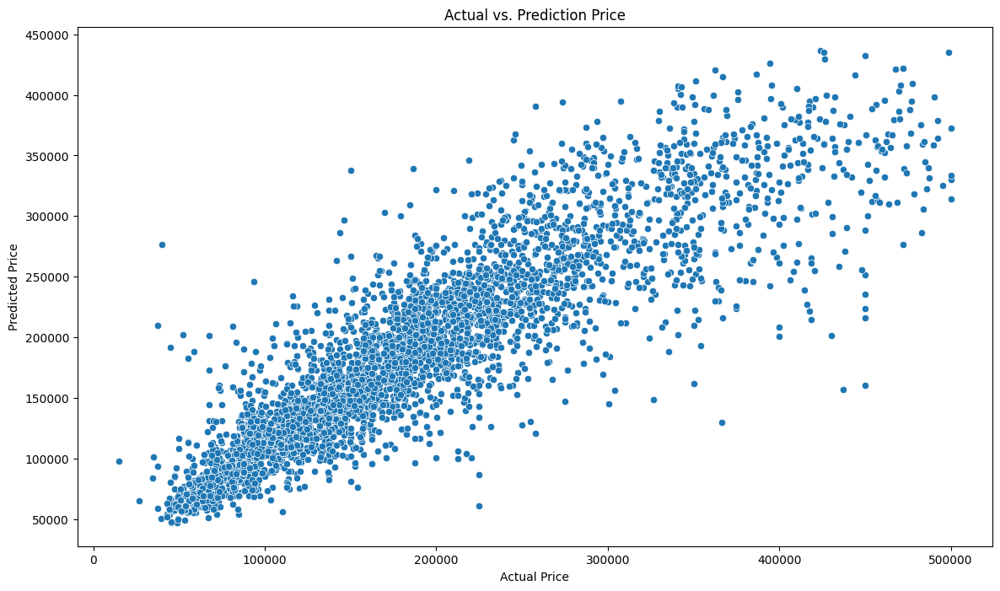

In [122]:
plt.figure(figsize=(14, 8))
plot = sns.scatterplot(x=y_test, y=y_pred_xgb_tuning).set(title='Actual vs. Prediction Price', 
                                               xlabel='Actual Price', 
                                               ylabel='Predicted Price');

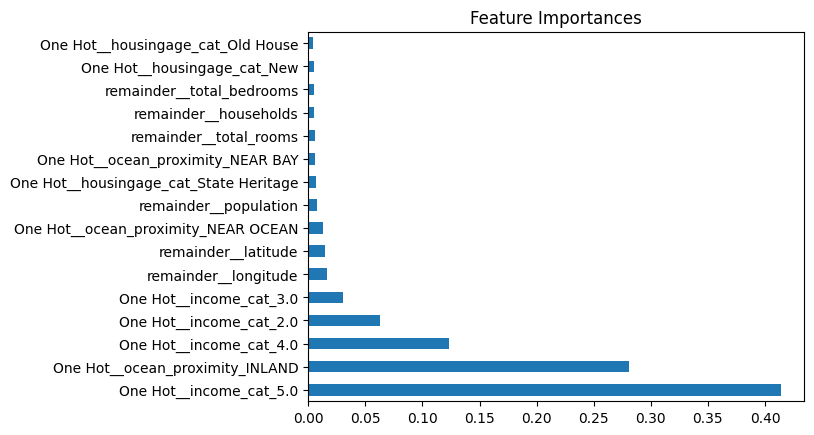

In [126]:
# Plot feature importances
feature_imp = pd.Series(xgb_tuning['model'].feature_importances_, transformer.get_feature_names_out()).sort_values(ascending = False)
feature_imp.plot(kind='barh', title='Feature Importances');

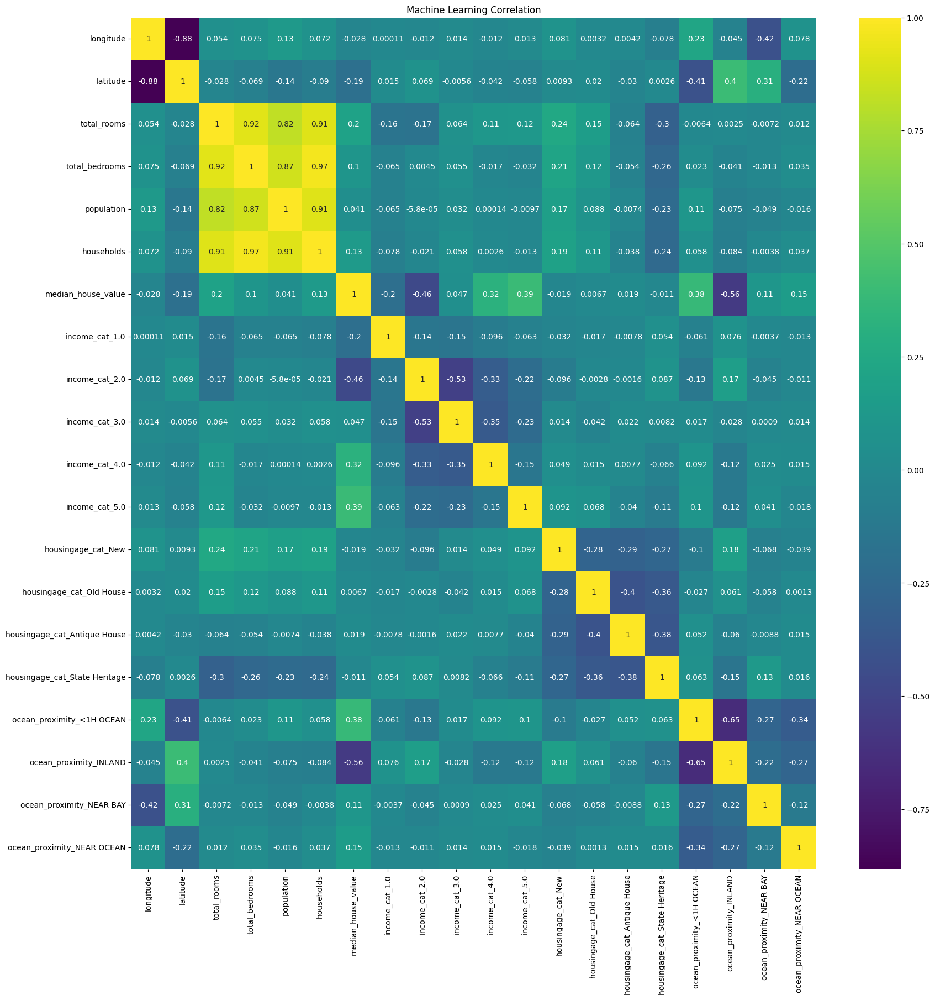

median_house_value               1.000000
income_cat_5.0                   0.393501
ocean_proximity_<1H OCEAN        0.376770
income_cat_4.0                   0.321871
total_rooms                      0.204501
ocean_proximity_NEAR OCEAN       0.147576
households                       0.133424
ocean_proximity_NEAR BAY         0.105826
total_bedrooms                   0.102692
income_cat_3.0                   0.047256
population                       0.041347
housingage_cat_Antique House     0.019139
housingage_cat_Old House         0.006667
housingage_cat_State Heritage   -0.010528
housingage_cat_New              -0.018779
longitude                       -0.027943
latitude                        -0.194339
income_cat_1.0                  -0.203196
income_cat_2.0                  -0.463221
ocean_proximity_INLAND          -0.560395
Name: median_house_value, dtype: float64

In [131]:
modelcorr= pd.get_dummies(dfModel,columns=['income_cat','housingage_cat','ocean_proximity'])

plt.figure(figsize=(20,20))
corr_ML = modelcorr.corr(method='spearman')
sns.heatmap(corr_ML,annot=True,cmap='viridis').set_title('Machine Learning Correlation')
plt.show()
# urutan korelasi dari terbesar sampai paling kecil terhadap median_house_value
display(corr_ML['median_house_value'].sort_values(ascending=False))